## Toronto Neighbourhood Clustering

First we nee to import all the library 

In [ ]:
import requests
from bs4 import BeautifulSoup
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import pandas as pd
import numpy as np

<p> Scraping data from Wikipedia Using BeautifulSoup.</p>

In [2]:
url="https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M"
n=requests.get(url)
scrap=BeautifulSoup(n.text,"lxml")  # will return all html code of that page

header=scrap.select("th") # extracting the <li> attribute
rows=scrap.select("tr")
neighborhod=[]
data=[]
for i in range(len(header)):
    neighborhod.append(header[i].getText())  # extracting the text inside of li tag
    
for j in rows:
    data.append(j.getText())  # extracting the text inside of li tag
data=data[1:]

<p> Making a data frame using the data that we Scraped.</p>

In [3]:
toronto_neighborhod=[]
for n in neighborhod:
    toronto_neighborhod.append(n.split("\n")[0])
toronto_neighborhod=pd.DataFrame(columns=toronto_neighborhod)

for i in data:
    code=i.split("\n\n")[0]
    brough=i.split("\n\n")[1]
    neighborhood=i.split("\n\n")[2]
    toronto_neighborhod=toronto_neighborhod.append({'Postal Code':code,'Borough':brough,'Neighbourhood':neighborhood},ignore_index=True)
toronto_neighborhod.drop('Canadian postal codes',axis=1,inplace=True)
toronto_neighborhod

,Postal Code,Borough,Neighbourhood
0,\nM1A,Not assigned,Not assigned\n
1,\nM2A,Not assigned,Not assigned\n
2,\nM3A,North York,Parkwoods\n
3,\nM4A,North York,Victoria Village\n
4,\nM5A,Downtown Toronto,"Regent Park, Harbourfront\n"
...,...,...,...
179,\nM9Z,Not assigned,Not assigned\n
180,,\nCanadian postal codes,\n
181,,,NL
182,\nNL,NS,PE


### Data Cleaning

I will use split method to split '\n' word and reassigning back to the original columns

In [4]:
toronto_neighborhod['Postal Code']=toronto_neighborhod['Postal Code'].str.split("\n").str[1]
toronto_neighborhod['Borough']=toronto_neighborhod['Borough'].str.split("\n").str[0]
toronto_neighborhod['Neighbourhood']=toronto_neighborhod['Neighbourhood'].str.split("\n").str[0]
toronto_neighborhod.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


Now I'll remove all the rows which have 'Not Assigned' value

In [5]:
i=toronto_neighborhod[toronto_neighborhod['Neighbourhood']=='Not assigned'].index.tolist()
print('Before Dropping the rows:{}'.format(toronto_neighborhod.shape[0]))
toronto_neighborhod.drop(i,axis=0,inplace=True)
print('After Dropping the rows:{}'.format(toronto_neighborhod.shape[0]))

Before Dropping the rows:184
After Dropping the rows:107


Now I'll use gecoder Library to fecth the cordinates of all the neighbourhood. Below code will try to find the cordinates and if not it will simply fill the value NA

In [6]:
#filtering the neighborhod for which geopy library can not able to find the cordinates
from geopy.geocoders import Nominatim 
n_name=[]
for name,index in zip(toronto_neighborhod['Neighbourhood'],toronto_neighborhod['Neighbourhood'].index):
        try:
            print('------'+name+'------')
            address='{},Toronto, Ontario'.format(name)
            gelocator=Nominatim(user_agent="Explorers")
            location=gelocator.geocode(address)
            lat=location.latitude
            lon=location.longitude
            toronto_neighborhod.loc[index, 'Latitude'] =lat
            toronto_neighborhod.loc[index, 'Longitude'] =lon
            print('Cordinates are {},{}'.format(lat,lon))
            print()
            n_name.append(name)
        except Exception as e:
            print('Sorry!! Can not find the Cordinates!!')

------Parkwoods------
Cordinates are 43.7611243,-79.3240594

------Victoria Village------
Cordinates are 43.732658,-79.3111892

------Regent Park, Harbourfront------
Cordinates are 43.6449033,-79.3818364

------Lawrence Manor, Lawrence Heights------
Cordinates are 43.7164765,-79.4424487

------Queen's Park, Ontario Provincial Government------
Sorry!! Can not found the Cordinates!!
------Islington Avenue, Humber Valley Village------
Cordinates are 43.6625296,-79.5311946

------Malvern, Rouge------
Cordinates are 43.8091955,-79.2217008

------Don Mills------
Cordinates are 43.775347,-79.3459439

------Parkview Hill, Woodbine Gardens------
Sorry!! Can not found the Cordinates!!
------Garden District, Ryerson------
Sorry!! Can not found the Cordinates!!
------Glencairn------
Cordinates are 43.7087117,-79.4406853

------West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale------
Sorry!! Can not found the Cordinates!!
------Rouge Hill, Port Union, Highland Creek------
Sorry!

In [7]:
toronto_neighborhod.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
2,M3A,North York,Parkwoods,43.761124,-79.324059
3,M4A,North York,Victoria Village,43.732658,-79.311189
4,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.644903,-79.381836
5,M6A,North York,"Lawrence Manor, Lawrence Heights",43.716476,-79.442449
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",NaN,NaN


Dropping all the NaN records.

In [8]:
toronto_neighborhod.dropna(inplace=True)
toronto_neighborhod=toronto_neighborhod.reset_index().drop('index',axis=1)
toronto_neighborhod.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.761124,-79.324059
1,M4A,North York,Victoria Village,43.732658,-79.311189
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.644903,-79.381836
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.716476,-79.442449
4,M9A,Etobicoke,"Islington Avenue, Humber Valley Village",43.662530,-79.531195


Let's just save our final dataset that we just scraped and cleaned

In [70]:
#saving our dataframe in CSvV file
toronto_neighborhod.to_csv("Toronto_neighbourhood.csv")
print('Saved Succeesfully!!')

Saved Succeesfully!!


Now we will define our ForsSquare Id so that we use it later in the code

In [87]:
CLIENT_ID = '**************' # your Foursquare ID
CLIENT_SECRET = '**************' # your Foursquare Secret
VERSION = '20210103' # Foursquare API version# A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: **************
CLIENT_SECRET:**************


We will make a Foursquare API url for Toronto so that we can make a call to api and retrived the venues from it.

In [90]:
address='Toronto'
geolocator=Nominatim(user_agent='Toronto Explorers')
location=geolocator.geocode(address)
lat=location.latitude
lon=location.longitude

print('Cordinates are {},{}'.format(lat,lon))
limit=1000
url='https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lon, 
limit)
print(url)

Cordinates are 43.6534817,-79.3839347
https://api.foursquare.com/v2/venues/explore?&client_id=**************&client_secret=**************&v=20210103&ll=43.6534817,-79.3839347&limit=1000


Below function will be used to extract the category of the venue

In [11]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Belwo function will be used to fecth the Neighbourhood name,venue name,latitude,longitude from the api result.

In [12]:
def getNearbyVenues(names, latitudes, longitudes,limit=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            limit)
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([(name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
        
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [13]:
torronto_venues = getNearbyVenues(names=toronto_neighborhod['Neighbourhood'],latitudes=toronto_neighborhod['Latitude'],longitudes=toronto_neighborhod['Longitude'])

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Islington Avenue, Humber Valley Village
Malvern, Rouge
Don Mills
Glencairn
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Thorncliffe Park
Dufferin, Dovercourt Village
Scarborough Village
Northwood Park, York University
Bayview Village
Downsview
York Mills, Silver Hills
Downsview
Humber Summit
Willowdale, Newtonbrook
Downsview
Studio District
Bedford Park, Lawrence Manor East
Willowdale, Willowdale East
Downsview
Lawrence Park
Roselawn
Runnymede, The Junction North
Weston
York Mills West
Davisville North
Forest Hill North & West, Forest Hill Road Park
High Park, The Junction South
Westmount
Willowdale, Willowdale West
Parkdale, Roncesvalles
Agincourt
Davisville
University of Toronto, Harbord
Runnymede, Swansea
Rosedale
Alderwood, Long Branch
Northwest, West Hum

In [14]:
torronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.761124,-79.324059,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.761124,-79.324059,Tim Hortons,43.760668,-79.326368,Café
2,Parkwoods,43.761124,-79.324059,Graydon Hall Manor,43.763923,-79.342961,Event Space
3,Parkwoods,43.761124,-79.324059,Tasty Shawarma & Falafel,43.776126,-79.318424,Falafel Restaurant
4,Parkwoods,43.761124,-79.324059,Fat Bastard Burrito Co,43.774146,-79.322276,Burrito Place


Importing the all the ploting library

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
import seaborn as sns
%matplotlib inline

Now we will group all the Neighbourhood so that we can cunt number of neighbourhood present in a neighbourhood

In [16]:
torronto_grouped=torronto_venues.groupby('Neighborhood').count()
torronto_grouped.head()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Agincourt,100,100,100,100,100,100
"Alderwood, Long Branch",100,100,100,100,100,100
Bayview Village,91,91,91,91,91,91
"Bedford Park, Lawrence Manor East",100,100,100,100,100,100
Berczy Park,100,100,100,100,100,100


Let's take a look of number of venues present in a particular neighbourhood. For that I'll plot a bar chart.

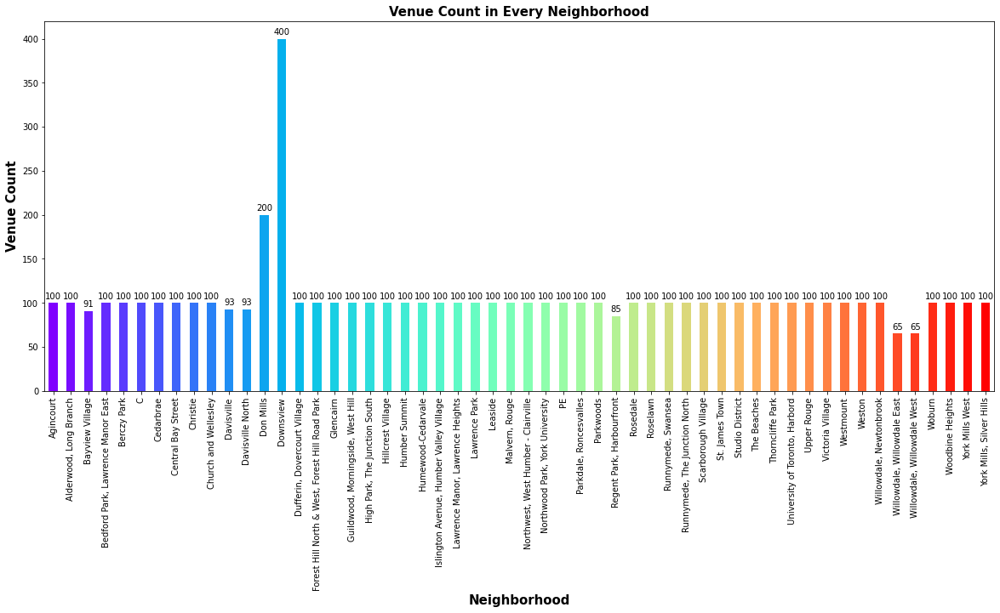

In [17]:

colors = iter(cm.rainbow(np.linspace(0, 1, len(torronto_grouped.index))))
plots=torronto_grouped['Venue Category'].plot(kind='bar',figsize=(20,8),color=colors)
plt.title('Venue Count in Every Neighborhood',fontdict={'fontsize':15,'fontweight':'bold'})
plt.xlabel('Neighborhood',fontdict={'fontsize':15,'fontweight':'bold'})
plt.ylabel('Venue Count',fontdict={'fontsize':15,'fontweight':'bold'})
# Iterrating over the bars one-by-one 
for bar in plots.patches: 
    
  # Using Matplotlib's annotate function and 
  # passing the coordinates where the annotation shall be done 
  # x-coordinate: bar.get_x() + bar.get_width() / 2 
  # y-coordinate: bar.get_height() 
  # free space to be left to make graph pleasing: (0, 8) 
  # ha and va stand for the horizontal and vertical alignment 
    plots.annotate(format(bar.get_height(), ''),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()),ha='center', va='center', 
                   size=10, xytext=(0, 8), 
                   textcoords='offset points') 

Looks like neighbourhood 'Downsview' have most number os venues in the city.

Let's Visulize the venue category in Downsview neighbourhood. For this also I'll be using a bar chart.

In [18]:
Downsview=torronto_venues[['Neighborhood','Venue Category','Venue']][torronto_venues['Neighborhood']=='Downsview'].groupby('Venue Category').count()
Downsview.drop('Neighborhood',axis=1,inplace=True)

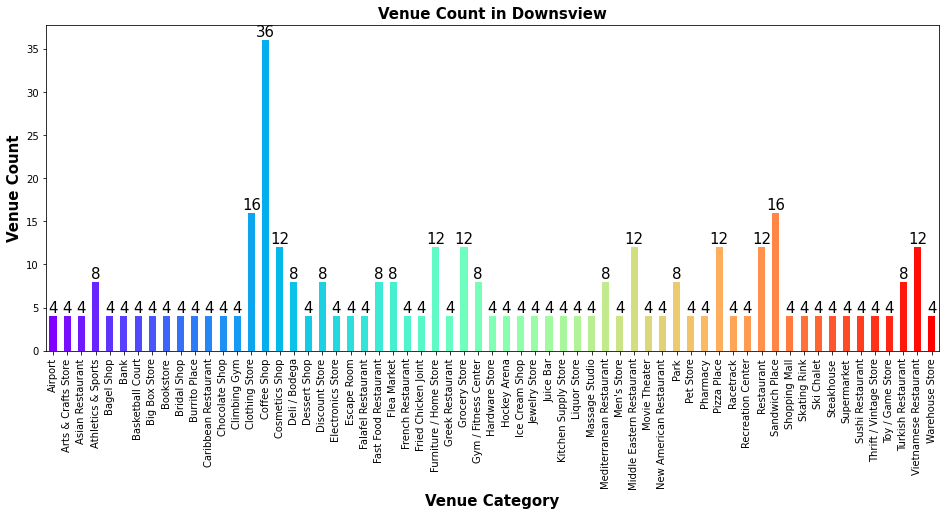

In [19]:
colors = iter(cm.rainbow(np.linspace(0, 1, len(Downsview.index))))

plots=Downsview['Venue'].plot(kind='bar',figsize=(16,6),color=colors) #plotting a bar chart and assigning it to a plots variable 
plt.title('Venue Count in Downsview',fontdict={'fontsize':15,'fontweight':'bold'})
plt.xlabel('Venue Category',fontdict={'fontsize':15,'fontweight':'bold'})
plt.ylabel('Venue Count',fontdict={'fontsize':15,'fontweight':'bold'})

# Iterrating over the bars one-by-one 
for bar in plots.patches:                                           # plots variable will be used to annote the text over a bar
  # Using Matplotlib's annotate function and 
  # passing the coordinates where the annotation shall be done 
  # x-coordinate: bar.get_x() + bar.get_width() / 2 
  # y-coordinate: bar.get_height() 
  # free space to be left to make graph pleasing: (0, 8) 
  # ha and va stand for the horizontal and vertical alignment 
    plots.annotate(format(bar.get_height(), ''),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()),ha='center', va='center', 
                   size=15, xytext=(0, 8), 
                   textcoords='offset points') 

In [74]:
import folium    
address='Toronto'
geolocator=Nominatim(user_agent='Toronto Explorers')
location=geolocator.geocode(address)
lat=location.latitude
lon=location.longitude

torronto_map=folium.Map(location=[lat,lon])
for name,lat,lon,cat in zip(torronto_venues['Neighborhood'],torronto_venues['Venue Latitude'],torronto_venues['Venue Longitude'],torronto_venues['Venue']):
    label='{},{}'.format(name,cat)
    folium.Marker([lat,lon],popup=label).add_to(torronto_map)
torronto_map
torronto_map.save 

## Neighborhood analysis

I'll next take a deep dive on each neighborhood I have identified till now by converting Venue Category to dummy variables 

In [30]:
# create a new dataframe by converting 'Venue Category' value to dummy values
torronto_onehot = pd.get_dummies(torronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to 'pune_onehot' dataframe from 'torronto_venues'
torronto_onehot['Neighborhood'] = torronto_venues['Neighborhood'] 

# move neighborhood column to the first column
#['Added']+list(manhattan_onehot.columns[:]) # will add a news column at the begining of the list
fixed_columns = [torronto_onehot.columns[-1]] + list(torronto_onehot.columns[:-1])
torronto_onehot = torronto_onehot[fixed_columns]

torronto_onehot.head()

,Zoo Exhibit,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Antique Shop,Aquarium,...,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Next, I'll take the mean of the frequency of occurrence of each category.

In [31]:
torronto_group=torronto_onehot.groupby('Neighborhood').mean().reset_index()
torronto_group.head()

,Neighborhood,Zoo Exhibit,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Antique Shop,...,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo
0,Agincourt,0.0,0.0,0.0,0.0,0.0,0.0,0.010000,0.0,0.0,...,0.0,0.01,0.00,0.0,0.00,0.01,0.0,0.0,0.00,0.0
1,"Alderwood, Long Branch",0.0,0.0,0.0,0.0,0.0,0.0,0.010000,0.0,0.0,...,0.0,0.01,0.01,0.0,0.00,0.02,0.0,0.0,0.01,0.0
2,Bayview Village,0.0,0.0,0.0,0.0,0.0,0.0,0.010989,0.0,0.0,...,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0
3,"Bedford Park, Lawrence Manor East",0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.00,0.00,0.0,0.00,0.01,0.0,0.0,0.02,0.0
4,Berczy Park,0.0,0.0,0.0,0.0,0.0,0.0,0.040000,0.0,0.0,...,0.0,0.00,0.00,0.0,0.01,0.00,0.0,0.0,0.00,0.0


Next, I'll plot the top 5 common venues in each neighborhood.

In [75]:
num_top_venues = 5
for hood in torronto_group['Neighborhood']:
    print("----"+hood+"----")
    temp = torronto_group[torronto_group['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                  venue  freq
0           Coffee Shop  0.07
1    Chinese Restaurant  0.06
2           Supermarket  0.04
3  Caribbean Restaurant  0.04
4        Clothing Store  0.04


----Alderwood, Long Branch----
                    venue  freq
0             Coffee Shop  0.05
1  Furniture / Home Store  0.04
2                  Bakery  0.04
3          Breakfast Spot  0.03
4           Burrito Place  0.03


----Bayview Village----
                venue  freq
0         Supermarket  0.04
1        Burger Joint  0.04
2  Chinese Restaurant  0.04
3              Bakery  0.04
4                Park  0.04


----Bedford Park, Lawrence Manor East----
              venue  freq
0       Coffee Shop  0.06
1       Pizza Place  0.04
2        Bagel Shop  0.04
3              Café  0.04
4  Sushi Restaurant  0.04


----Berczy Park----
                 venue  freq
0          Coffee Shop  0.11
1   Seafood Restaurant  0.05
2                 Café  0.05
3            Gastropub  0.04
4  American Rest

In [76]:
#let's write a function to sort the venues in descending order.
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Let's get the top 10 venues for each location.

In [77]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = torronto_group['Neighborhood']

for ind in np.arange(torronto_group.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(torronto_group.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Coffee Shop,Chinese Restaurant,Supermarket,Caribbean Restaurant,Clothing Store,Breakfast Spot,Bank,Bakery,Pharmacy,Noodle House
1,"Alderwood, Long Branch",Coffee Shop,Furniture / Home Store,Bakery,Grocery Store,Seafood Restaurant,Burger Joint,Burrito Place,Breakfast Spot,Gym,Sporting Goods Shop
2,Bayview Village,Park,Burger Joint,Chinese Restaurant,Bakery,Supermarket,Grocery Store,Shopping Mall,Middle Eastern Restaurant,Japanese Restaurant,Fried Chicken Joint
3,"Bedford Park, Lawrence Manor East",Coffee Shop,Bagel Shop,Grocery Store,Sushi Restaurant,Pizza Place,Café,Bakery,Sandwich Place,Burger Joint,Ice Cream Shop
4,Berczy Park,Coffee Shop,Seafood Restaurant,Café,Gastropub,American Restaurant,Restaurant,Japanese Restaurant,Bakery,Gym,Hotel


## Clustering

I'll build 10 clusters on the dataset.

In [78]:
from sklearn.cluster import KMeans
torronto_group_clustering = torronto_group.drop('Neighborhood', 1)
k=10 # we want 10 cluster
kmean=KMeans(n_clusters=k,random_state=0)
kmean.fit(torronto_group_clustering)
kmean.labels_[0:10]

array([6, 1, 6, 7, 0, 7, 2, 1, 3, 7])

Insert the new column with cluseters values

In [79]:
neighborhoods_venues_sorted.insert(0,'Clusters',kmean.labels_)
neighborhoods_venues_sorted.head()

,Clusters,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,6,Agincourt,Coffee Shop,Chinese Restaurant,Supermarket,Caribbean Restaurant,Clothing Store,Breakfast Spot,Bank,Bakery,Pharmacy,Noodle House
1,1,"Alderwood, Long Branch",Coffee Shop,Furniture / Home Store,Bakery,Grocery Store,Seafood Restaurant,Burger Joint,Burrito Place,Breakfast Spot,Gym,Sporting Goods Shop
2,6,Bayview Village,Park,Burger Joint,Chinese Restaurant,Bakery,Supermarket,Grocery Store,Shopping Mall,Middle Eastern Restaurant,Japanese Restaurant,Fried Chicken Joint
3,7,"Bedford Park, Lawrence Manor East",Coffee Shop,Bagel Shop,Grocery Store,Sushi Restaurant,Pizza Place,Café,Bakery,Sandwich Place,Burger Joint,Ice Cream Shop
4,0,Berczy Park,Coffee Shop,Seafood Restaurant,Café,Gastropub,American Restaurant,Restaurant,Japanese Restaurant,Bakery,Gym,Hotel


In [80]:
torronto_merged = torronto_venues  #merger with toronto data 

# merge torronto_venues to add latitude/longitude for each neighborhood
torronto_merged = torronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
torronto_merged.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Parkwoods,43.761124,-79.324059,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant,6,Middle Eastern Restaurant,Coffee Shop,Chinese Restaurant,Japanese Restaurant,Restaurant,Supermarket,Bakery,Grocery Store,Fast Food Restaurant,American Restaurant
1,Parkwoods,43.761124,-79.324059,Tim Hortons,43.760668,-79.326368,Café,6,Middle Eastern Restaurant,Coffee Shop,Chinese Restaurant,Japanese Restaurant,Restaurant,Supermarket,Bakery,Grocery Store,Fast Food Restaurant,American Restaurant
2,Parkwoods,43.761124,-79.324059,Graydon Hall Manor,43.763923,-79.342961,Event Space,6,Middle Eastern Restaurant,Coffee Shop,Chinese Restaurant,Japanese Restaurant,Restaurant,Supermarket,Bakery,Grocery Store,Fast Food Restaurant,American Restaurant
3,Parkwoods,43.761124,-79.324059,Tasty Shawarma & Falafel,43.776126,-79.318424,Falafel Restaurant,6,Middle Eastern Restaurant,Coffee Shop,Chinese Restaurant,Japanese Restaurant,Restaurant,Supermarket,Bakery,Grocery Store,Fast Food Restaurant,American Restaurant
4,Parkwoods,43.761124,-79.324059,Fat Bastard Burrito Co,43.774146,-79.322276,Burrito Place,6,Middle Eastern Restaurant,Coffee Shop,Chinese Restaurant,Japanese Restaurant,Restaurant,Supermarket,Bakery,Grocery Store,Fast Food Restaurant,American Restaurant


Definign the colour code for each clusters.

In [82]:
# creating the color code  of all clusters
def color(i):
    if(i==0):
        return 'orange'
    elif(i==1):
        return 'green'
    elif(i==2):
        return 'beige'
    elif(i==3):
        return 'red'
    elif(i==4):
        return 'blue'
    elif(i==5):
        return 'purple'
    elif(i==6):
        return 'black'
    elif(i==7):
        return 'pink'
    elif(i==8):
        return 'darkblue'
    elif(i==9):
        return 'cadetblue'
    else:
        return None
torronto_merged['Colors']=torronto_merged['Clusters'].apply(color)

In [83]:
# finnaly create a map
import folium
address="Toronto"
g=Nominatim(user_agent="Canada")
l=g.geocode(address)
lat=l.latitude
lon=l.longitude

map_clusters = folium.Map(location=[lat, lon], zoom_start=11)

# add markers to the map
for lat, lon, name, cluster,c,cat in zip(torronto_merged['Venue Latitude'], torronto_merged['Venue Longitude'], torronto_merged['Venue'], torronto_merged['Clusters'],torronto_merged['Colors'],torronto_merged['Venue Category']):
    label ='{},{},{}'.format(name,cat,cluster)
    folium.(
        [lat, lon],
        popup=label,
        radius = 50,
        color=c,
        fill = True,
        fill_color = c,
        fill_opacity = 0.7,
        parse_html = False).add_to(map_clusters)
       
map_clusters

## Let's analyse the each cluster.

Let's find the most common venue in all clusters

In [84]:
# finding the most common vanues in all clusters
cluster=torronto_merged['Clusters'].value_counts().index.tolist()
for c in cluster:
    common=torronto_merged[torronto_merged['Clusters']==c]['1st Most Common Venue'].value_counts().reset_index().values.tolist()[0][0]
    print()
    print('Most Comon venue in Clusters {} is {}'.format(c,common))


Most Comon venue in Clusters 7 is Coffee Shop

Most Comon venue in Clusters 1 is Coffee Shop

Most Comon venue in Clusters 6 is Middle Eastern Restaurant

Most Comon venue in Clusters 5 is Italian Restaurant

Most Comon venue in Clusters 2 is Coffee Shop

Most Comon venue in Clusters 4 is Café

Most Comon venue in Clusters 8 is Coffee Shop

Most Comon venue in Clusters 0 is Coffee Shop

Most Comon venue in Clusters 3 is Korean Restaurant

Most Comon venue in Clusters 9 is Zoo Exhibit


Looks Line Coffee shop is the most common venue in all clusters

In [85]:
# finding the least common vanues in all clusters
cluster=torronto_merged['Clusters'].value_counts().index.tolist()
for c in cluster:
    common=torronto_merged[torronto_merged['Clusters']==c]['10th Most Common Venue'].value_counts().reset_index().values.tolist()[0][0]
    print()
    print('Least Comon venue in Clusters {} is {}'.format(c,common))


Least Comon venue in Clusters 7 is Thai Restaurant

Least Comon venue in Clusters 1 is Cosmetics Shop

Least Comon venue in Clusters 6 is Italian Restaurant

Least Comon venue in Clusters 5 is Breakfast Spot

Least Comon venue in Clusters 2 is Gas Station

Least Comon venue in Clusters 4 is Pizza Place

Least Comon venue in Clusters 8 is Italian Restaurant

Least Comon venue in Clusters 0 is Breakfast Spot

Least Comon venue in Clusters 3 is Discount Store

Least Comon venue in Clusters 9 is Supermarket


In [86]:
# finding the 5th common vanues in all clusters
cluster=torronto_merged['Clusters'].value_counts().index.tolist()
for c in cluster:
    common=torronto_merged[torronto_merged['Clusters']==c]['5th Most Common Venue'].value_counts().reset_index().values.tolist()[0][0]
    print()
    print('5th Comon venue in Clusters {} is {}'.format(c,common))


5th Comon venue in Clusters 7 is Café

5th Comon venue in Clusters 1 is Furniture / Home Store

5th Comon venue in Clusters 6 is Bakery

5th Comon venue in Clusters 5 is Deli / Bodega

5th Comon venue in Clusters 2 is Pharmacy

5th Comon venue in Clusters 4 is Park

5th Comon venue in Clusters 8 is Pizza Place

5th Comon venue in Clusters 0 is American Restaurant

5th Comon venue in Clusters 3 is Pizza Place

5th Comon venue in Clusters 9 is Sandwich Place
